In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import FunctionTransformer
from sklearn.impute import SimpleImputer
from sklearn.feature_extraction import FeatureHasher
from imblearn.over_sampling import SMOTE
from sklearn.feature_selection import SelectKBest, chi2
import math

In [ ]:
# Memuat data
df = pd.read_csv('../../Resource/address_dataset_kaggle.csv', index_col=0)
df.shape


(9841, 51)

In [ ]:
columns_drop = ['Index', 'Address']  
df = df.drop(columns=columns_drop)

In [ ]:
num_cols = df.select_dtypes(include=['float64', 'int64']).columns
num_imputer = SimpleImputer(strategy='mean')
df[num_cols] = num_imputer.fit_transform(df[num_cols])

cat_cols = df.select_dtypes(include=['object']).columns
cat_imputer = SimpleImputer(strategy='most_frequent')
df[cat_cols] = cat_imputer.fit_transform(df[cat_cols])

In [ ]:
X = df.drop(columns=['FLAG'])
y = df['FLAG']

In [ ]:
hasher = FeatureHasher(n_features=20, input_type='string')  # Adjust n_features as needed
cat_cols_in_X = X.select_dtypes(include=['object']).columns

for col in cat_cols_in_X:
    data_to_hash = X[col].astype(str).values.reshape(-1, 1)
    hashed_features = hasher.transform(data_to_hash).toarray()
    hashed_df = pd.DataFrame(hashed_features, columns=[f"{col}_hashed_{i}" for i in range(hashed_features.shape[1])])
    X = pd.concat([X, hashed_df], axis=1)
    X.drop(columns=[col], inplace=True)

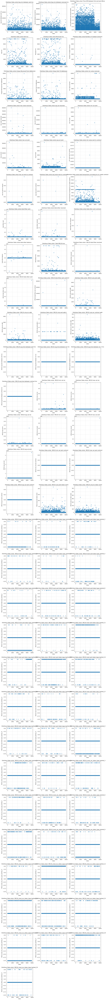

In [2]:
num_cols_in_X = X.select_dtypes(include=['float64', 'int64']).columns
n_plots = len(num_cols_in_X)
n_rows = math.ceil(n_plots / 3)

plt.figure(figsize=(15, 5 * n_rows))
for idx, col in enumerate(num_cols_in_X, 1):
    plt.subplot(n_rows, 3, idx)
    plt.scatter(range(len(X)), X[col], alpha=0.5)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.title(f'Distribusi Data untuk {col}')
    plt.xlabel('Index')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

In [ ]:
# Mengganti nilai yang <= 0 dengan angka kecil sebelum transformasi log
X_safe = X.copy()

# Pastikan tidak ada nilai <= 0 yang ada dalam dataset
X_safe[num_cols_in_X] = X_safe[num_cols_in_X].apply(lambda col: col.apply(lambda x: x if x > 0 else 0.001))

# Terapkan log transformasi menggunakan FunctionTransformer
log_transformer = FunctionTransformer(np.log1p, validate=True)

# Terapkan transformasi log
X_log = log_transformer.fit_transform(X_safe[num_cols_in_X])

# Gabungkan hasil kembali ke DataFrame
X_log = pd.DataFrame(X_log, columns=num_cols_in_X)

# Gantikan kolom yang telah ditransformasi kembali ke DataFrame X
X[num_cols_in_X] = X_log


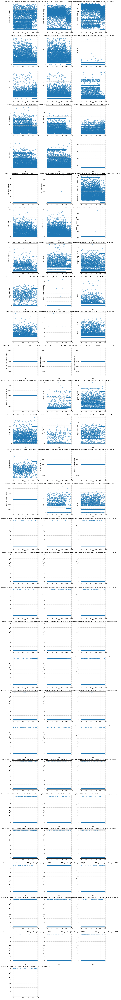

In [4]:
plt.figure(figsize=(15, 5 * n_rows))
for idx, col in enumerate(num_cols_in_X, 1):
    plt.subplot(n_rows, 3, idx)
    plt.scatter(range(len(X_log)), X_log[col], alpha=0.5)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.title(f'Distribusi Data setelah Log Transform untuk {col}')
    plt.xlabel('Index')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

In [5]:
X_log_categorical = X_log.select_dtypes(include=['float64', 'int64'])  
X_log_categorical = pd.DataFrame(X_log_categorical)

X_log_categorical = X_log_categorical.apply(lambda x: pd.cut(x, bins=5, labels=[1, 2, 3, 4, 5]))  

selector = SelectKBest(chi2, k='all')  
selector.fit(X_log_categorical, y)

SelectKBest(k='all', score_func=<function chi2 at 0x000002803B5D24D0>)

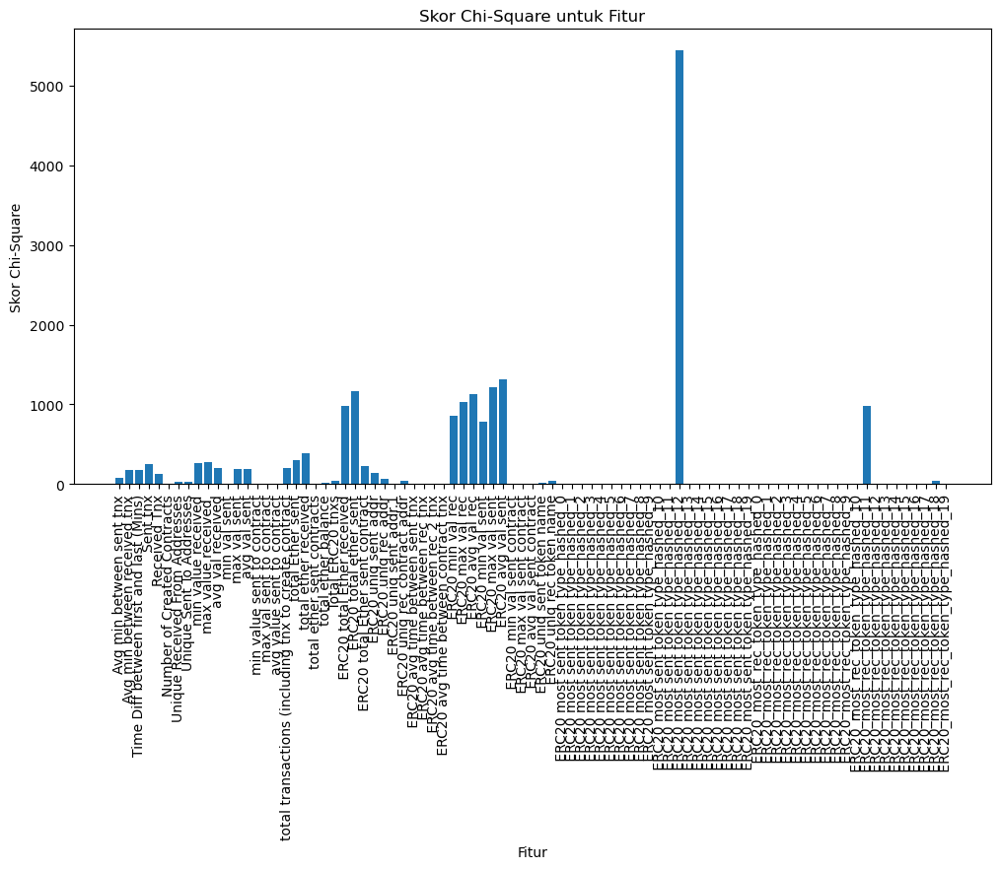

In [6]:
plt.figure(figsize=(12, 6))
plt.bar(X_log_categorical.columns, selector.scores_)
plt.title('Skor Chi-Square untuk Fitur')
plt.xlabel('Fitur')
plt.ylabel('Skor Chi-Square')
plt.xticks(rotation=90)
plt.show()

In [7]:
threshold = 100  # Bisa disesuaikan, ini menggunakan rata-rata skor chi-square #np.mean(selector.scores_) == 300

relevant_features_chi2 = X_log_categorical.columns[selector.scores_ > threshold]

print("Fitur yang relevan berdasarkan chi-square test (skor > threeshold):")
for feature in relevant_features_chi2:
    print(f"{feature}: {selector.scores_[X_log_categorical.columns.get_loc(feature)]:.4f}")

Fitur yang relevan berdasarkan chi-square test (skor > threeshold):
Avg min between received tnx: 177.7132
Time Diff between first and last (Mins): 175.6522
Sent tnx: 247.4451
Received Tnx: 131.8435
min value received: 263.3051
max value received : 277.7538
avg val received: 200.2462
max val sent: 186.3658
avg val sent: 192.3854
total transactions (including tnx to create contract: 202.1022
total Ether sent: 303.8070
total ether received: 392.5046
 ERC20 total Ether received: 985.7851
 ERC20 total ether sent: 1168.8957
 ERC20 total Ether sent contract: 225.7473
 ERC20 uniq sent addr: 134.5069
 ERC20 min val rec: 857.7619
 ERC20 max val rec: 1033.2032
 ERC20 avg val rec: 1125.6888
 ERC20 min val sent: 782.2771
 ERC20 max val sent: 1218.2231
 ERC20 avg val sent: 1310.6452
 ERC20 most sent token type_hashed_12: 5438.0768
 ERC20_most_rec_token_type_hashed_11: 982.7025


In [8]:
X_log = X_log[relevant_features_chi2]

In [9]:
X_log.columns

Index(['Avg min between received tnx',
       'Time Diff between first and last (Mins)', 'Sent tnx', 'Received Tnx',
       'min value received', 'max value received ', 'avg val received',
       'max val sent', 'avg val sent',
       'total transactions (including tnx to create contract',
       'total Ether sent', 'total ether received',
       ' ERC20 total Ether received', ' ERC20 total ether sent',
       ' ERC20 total Ether sent contract', ' ERC20 uniq sent addr',
       ' ERC20 min val rec', ' ERC20 max val rec', ' ERC20 avg val rec',
       ' ERC20 min val sent', ' ERC20 max val sent', ' ERC20 avg val sent',
       ' ERC20 most sent token type_hashed_12',
       ' ERC20_most_rec_token_type_hashed_11'],
      dtype='object')

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X_log, y, test_size=0.2, random_state=42)

In [11]:
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

In [12]:
X_train_smote.to_csv("../../Data/chi-square/n=20/100/X_train_smote.csv", index=False)
X_test.to_csv("../../Data/chi-square/n=20/100/X_test.csv", index=False)
y_train_smote.to_csv("../../Data/chi-square/n=20/100/y_train_smote.csv", index=False)
y_test.to_csv("../../Data/chi-square/n=20/100/y_test.csv", index=False)

In [13]:
print(X_train_smote.shape)
print(X_test.shape)
print(y_train_smote.shape)
print(y_test.shape)

(12240, 24)
(1969, 24)
(12240,)
(1969,)


In [ ]:
# import pandas as pd
# import numpy as np
# import seaborn as sns
# import matplotlib.pyplot as plt
# from sklearn.model_selection import train_test_split
# from sklearn.preprocessing import FunctionTransformer
# from sklearn.impute import SimpleImputer
# from sklearn.feature_extraction import FeatureHasher
# from imblearn.over_sampling import SMOTE
# from sklearn.feature_selection import SelectKBest, chi2
# import math

# # Memuat data
# df = pd.read_csv('../../Resource/address_dataset_kaggle.csv', index_col=0)

# columns_drop = ['Index', 'Address']  
# df = df.drop(columns=columns_drop)

# num_cols = df.select_dtypes(include=['float64', 'int64']).columns
# num_imputer = SimpleImputer(strategy='mean')
# df[num_cols] = num_imputer.fit_transform(df[num_cols])

# cat_cols = df.select_dtypes(include=['object']).columns
# cat_imputer = SimpleImputer(strategy='most_frequent')
# df[cat_cols] = cat_imputer.fit_transform(df[cat_cols])

# X = df.drop(columns=['FLAG'])
# y = df['FLAG']

# hasher = FeatureHasher(n_features=20, input_type='string')  # Adjust n_features as needed
# cat_cols_in_X = X.select_dtypes(include=['object']).columns

# for col in cat_cols_in_X:
#     data_to_hash = X[col].astype(str).values.reshape(-1, 1)
#     hashed_features = hasher.transform(data_to_hash).toarray()
#     hashed_df = pd.DataFrame(hashed_features, columns=[f"{col}_hashed_{i}" for i in range(hashed_features.shape[1])])
#     X = pd.concat([X, hashed_df], axis=1)
#     X.drop(columns=[col], inplace=True)
    
# num_cols_in_X = X.select_dtypes(include=['float64', 'int64']).columns
# n_plots = len(num_cols_in_X)
# n_rows = math.ceil(n_plots / 3)

# plt.figure(figsize=(15, 5 * n_rows))
# for idx, col in enumerate(num_cols_in_X, 1):
#     plt.subplot(n_rows, 3, idx)
#     plt.scatter(range(len(X)), X[col], alpha=0.5)
#     plt.grid(True, linestyle='--', alpha=0.7)
#     plt.title(f'Distribusi Data untuk {col}')
#     plt.xlabel('Index')
#     plt.ylabel(col)
# plt.tight_layout()
# plt.show()

# # Mengganti nilai yang <= 0 dengan angka kecil sebelum transformasi log
# X_safe = X.copy()

# # Pastikan tidak ada nilai <= 0 yang ada dalam dataset
# X_safe[num_cols_in_X] = X_safe[num_cols_in_X].apply(lambda col: col.apply(lambda x: x if x > 0 else 0.001))

# # Terapkan log transformasi menggunakan FunctionTransformer
# log_transformer = FunctionTransformer(np.log1p, validate=True)

# # Terapkan transformasi log
# X_log = log_transformer.fit_transform(X_safe[num_cols_in_X])

# # Gabungkan hasil kembali ke DataFrame
# X_log = pd.DataFrame(X_log, columns=num_cols_in_X)

# # Gantikan kolom yang telah ditransformasi kembali ke DataFrame X
# X[num_cols_in_X] = X_log

# plt.figure(figsize=(15, 5 * n_rows))
# for idx, col in enumerate(num_cols_in_X, 1):
#     plt.subplot(n_rows, 3, idx)
#     plt.scatter(range(len(X_log)), X_log[col], alpha=0.5)
#     plt.grid(True, linestyle='--', alpha=0.7)
#     plt.title(f'Distribusi Data setelah Log Transform untuk {col}')
#     plt.xlabel('Index')
#     plt.ylabel(col)
# plt.tight_layout()
# plt.show()

# X_log_categorical = X_log.select_dtypes(include=['float64', 'int64'])  
# X_log_categorical = pd.DataFrame(X_log_categorical)

# X_log_categorical = X_log_categorical.apply(lambda x: pd.cut(x, bins=5, labels=[1, 2, 3, 4, 5]))  

# selector = SelectKBest(chi2, k='all')  
# selector.fit(X_log_categorical, y)

# plt.figure(figsize=(12, 6))
# plt.bar(X_log_categorical.columns, selector.scores_)
# plt.title('Skor Chi-Square untuk Fitur')
# plt.xlabel('Fitur')
# plt.ylabel('Skor Chi-Square')
# plt.xticks(rotation=90)
# plt.show()

# threshold = 100  # Bisa disesuaikan, ini menggunakan rata-rata skor chi-square #np.mean(selector.scores_) == 300

# relevant_features_chi2 = X_log_categorical.columns[selector.scores_ > threshold]

# print("Fitur yang relevan berdasarkan chi-square test (skor > threeshold):")
# for feature in relevant_features_chi2:
#     print(f"{feature}: {selector.scores_[X_log_categorical.columns.get_loc(feature)]:.4f}")

# X_log = X_log[relevant_features_chi2]
# X_log.columns

# X_train, X_test, y_train, y_test = train_test_split(X_log, y, test_size=0.2, random_state=42)

# smote = SMOTE(random_state=42)
# X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# X_train_smote.to_csv("../../Data/chi-square/n=20/100/X_train_smote.csv", index=False)
# X_test.to_csv("../../Data/chi-square/n=20/100/X_test.csv", index=False)
# y_train_smote.to_csv("../../Data/chi-square/n=20/100/y_train_smote.csv", index=False)
# y_test.to_csv("../../Data/chi-square/n=20/100/y_test.csv", index=False)

# print(X_train_smote.shape)
# print(X_test.shape)
# print(y_train_smote.shape)
# print(y_test.shape)